In [1]:
import numpy as np
from PIL import Image
import cv2

import matplotlib.pyplot as plt

from row_column_processing import *

In [2]:
files = [
    '../data/cathedral/d001.jpg' ,
    '../data/cathedral/d002.jpg',
    '../data/cathedral/d003.jpg',
    '../data/cathedral/d004.jpg',
    '../data/cathedral/d005.jpg',
    '../data/cathedral/result.png'
]

images = [cv2.imread(x, 1) for x in files]

images, target = images[:-1], images[-1]

In [3]:
def imshow(images: np.array) -> None:
    """Display images in jupyter notebook

    :param images: array with images
    :type images: np.array
    """
    images = images.clip(0, 255).astype('uint8')
    if images.ndim == 3:
        if images.shape[2] == 4:
            images = cv2.cvtColor(images, cv2.COLOR_BGRA2RGBA)
        else:
            images = cv2.cvtColor(images, cv2.COLOR_BGR2RGB)
    display(Image.fromarray(images))

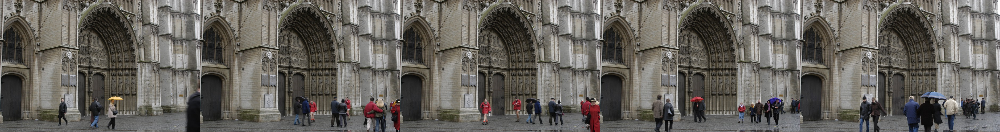

In [4]:
imshow(np.concatenate(images[:5], 1))

In [5]:
output = clean_background(images)

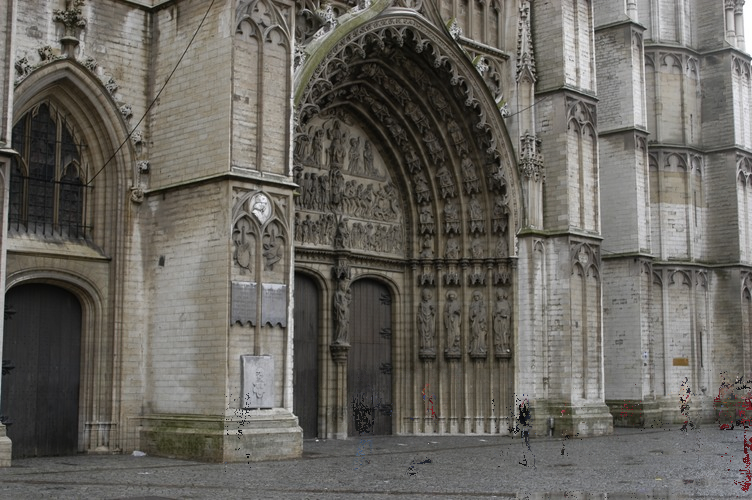

In [6]:
imshow(output)

# Approach step by step

1. First step is to perform median filter through all images at once. We take all images and for each pixel compute median value through all the images.

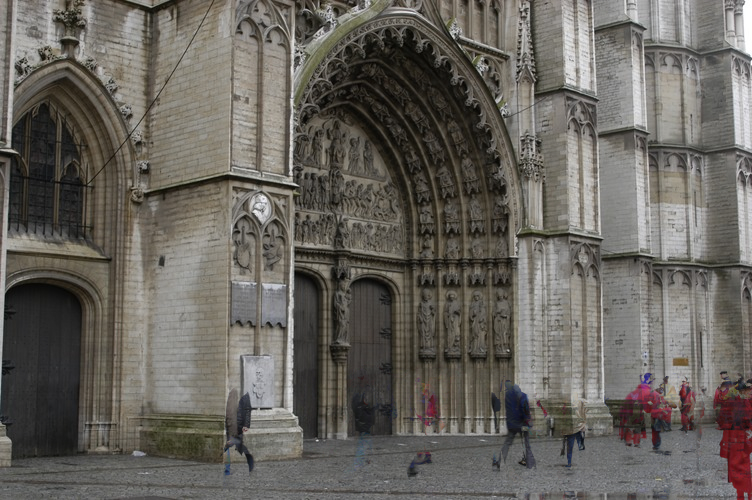

In [8]:
images_median = get_median_image(images)
imshow(images_median)

Median filter performed through multiple images is the easiest way to obtain clear background, however it requiers a lot of images in the dataset. In our case it's not enough to clean background perfectly.

2. Right now we will try to separate pixels which contains people by computing difference between images.

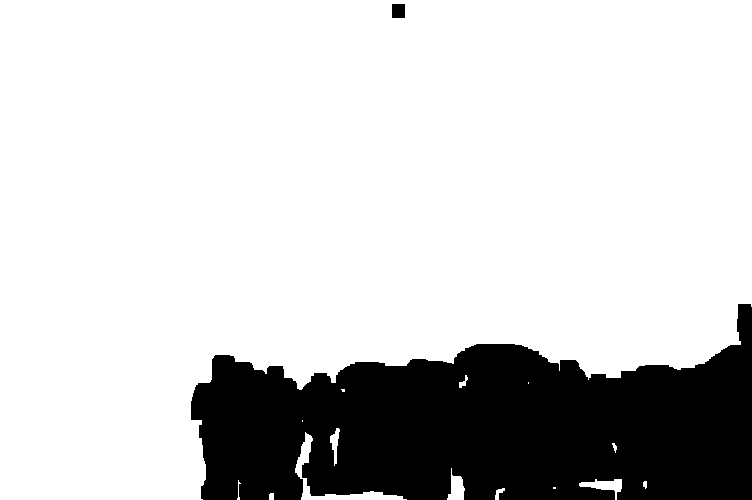

In [9]:
no_noise_map = get_no_noise_map(images) * 255
struct = np.ones((3,3), np.uint8)

eroded = cv2.dilate(no_noise_map/255, struct, iterations=3)
img_closed = cv2.erode(eroded, struct, iterations=6) * 255

imshow(img_closed)

In [14]:
avg_images_median = images_median.copy()
for y in range(500):
    for x in range(752):
        if img_closed[y][x] == 0.0:
            # TODO: Change get_available_pixels function
            pixels = get_available_pixels(images, y, x)
            avg_images_median[y][x] = average_closest_pixels(pixels)

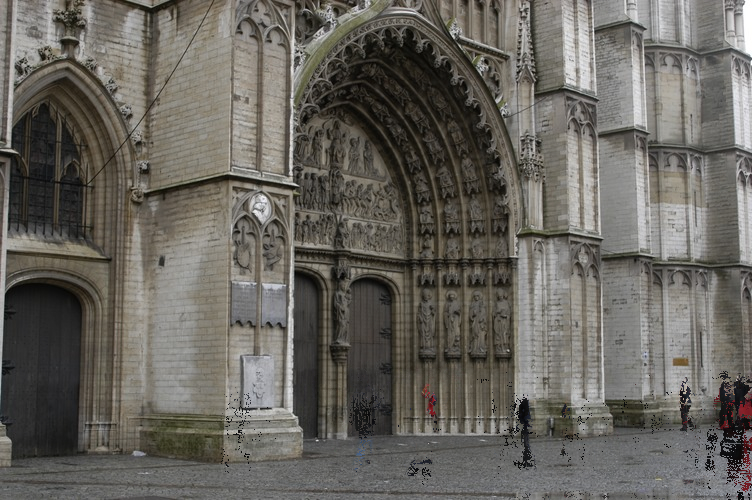

In [15]:
imshow(avg_images_median)

Right now, we create another mask to separate pixels which contains people, but right now we will use median image from step 1 and image above.

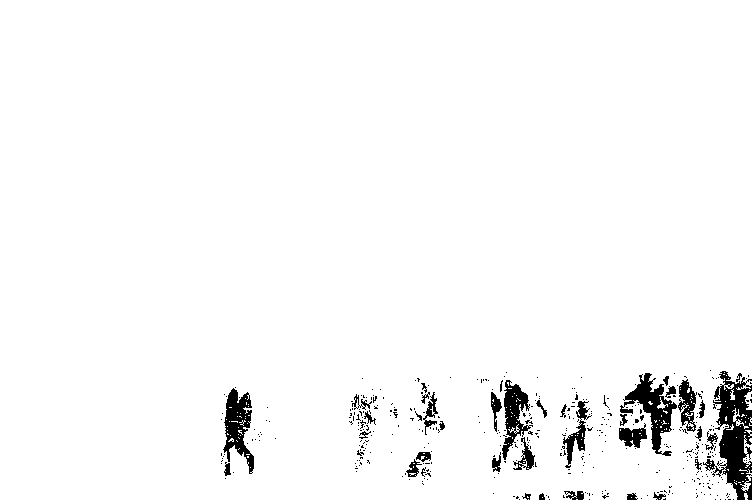

In [16]:
noise_map = get_no_noise_map(np.array([images_median, avg_images_median])) * 255
struct = np.ones((1,1), np.uint8)

eroded = cv2.dilate(noise_map/255, struct, iterations=3)
new_diff = cv2.erode(eroded, struct, iterations=6) * 255

imshow(new_diff)

Right now we iterate over pixels which are black in the image above, for each such a pixel we compute row and column mean and from all available pixels value for that position we take pixel which is the closest the both means.

In [17]:
output = avg_images_median.copy()
    # TODO: Optimize not use loops
for y in range(500):
    for x in range(752):
        if new_diff[y][x] == 0.0 and (np.all(avg_images_median[y][x]<65.0) or detect_outlier(avg_images_median[y][x])):
            row_mean = np.mean(avg_images_median[y], axis=0)
            column_mean = np.mean(avg_images_median[:, x, :], axis=0)
            output[y][x] = compute_closest_to_mean(row_mean, column_mean, get_available_pixels(images, y, x))

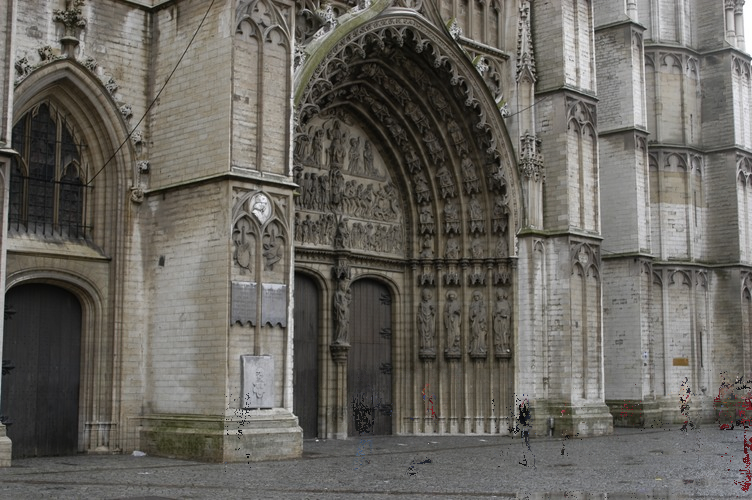

In [18]:
imshow(output)

# second dataset

In [7]:
lego = [
    '../data/lego/IMG_1667.JPEG' ,
    '../data/lego/IMG_1668.JPEG',
    '../data/lego/IMG_1669.JPEG',
    '../data/lego/IMG_1670.JPEG',
    '../data/lego/IMG_1671.JPEG',
    '../data/lego/IMG_1672.JPEG',
    '../data/lego/IMG_1673.JPEG',
    '../data/lego/IMG_1674.JPEG',
    '../data/lego/IMG_1675.JPEG',
    '../data/lego/IMG_1676.JPEG',
    '../data/lego/IMG_1677.JPEG'
]

lego = [cv2.imread(x, 1) for x in lego]

In [8]:
#resize images
lego = [cv2.resize(img, (667, 500), interpolation = cv2.INTER_AREA) for img in lego]

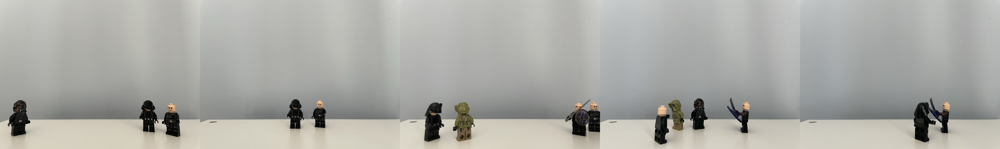

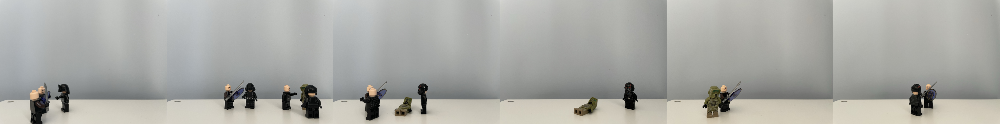

In [12]:
imshow(np.concatenate(lego[:5], 1))
imshow(np.concatenate(lego[5:], 1))


In [10]:
lego_clean = clean_background(lego)

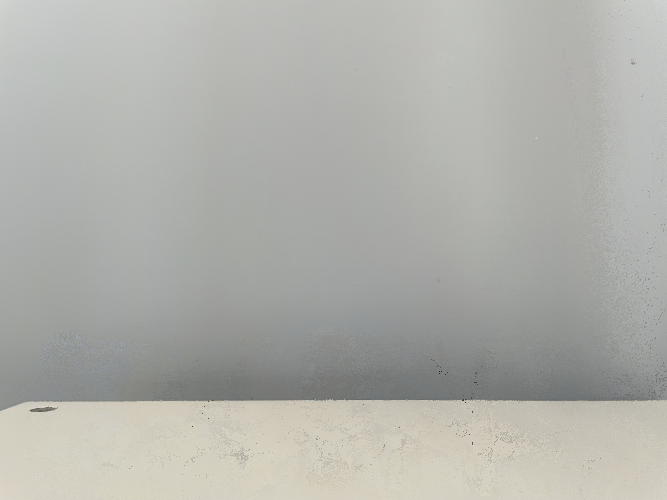

In [11]:
imshow(lego_clean)

1. Median filter result on lego dataset

In [13]:
lego_median = get_median_image(lego)

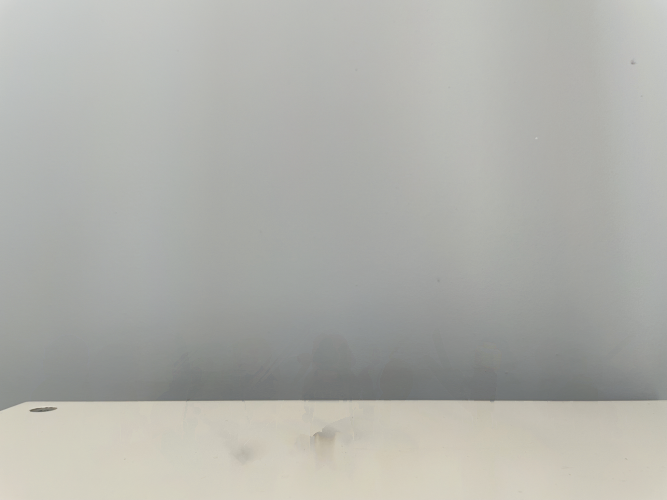

In [14]:
imshow(lego_median)

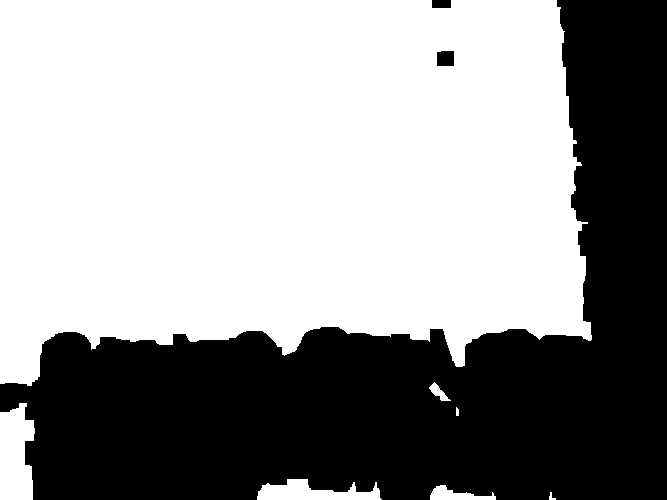

In [16]:
noise_lego = get_no_noise_map(lego) * 255
struct = np.ones((3,3), np.uint8)

lego_eroded = cv2.dilate(noise_lego/255, struct, iterations=3)
lego_closed = cv2.erode(lego_eroded, struct, iterations=6) * 255

imshow(lego_closed)

In [18]:
avg_lego_median = lego_median.copy()
for y in range(500):
    for x in range(667):
        if lego_closed[y][x] == 0.0:
            # TODO: Change get_available_pixels function
            pixels = get_available_pixels(lego, y, x)
            avg_lego_median[y][x] = average_closest_pixels(pixels)

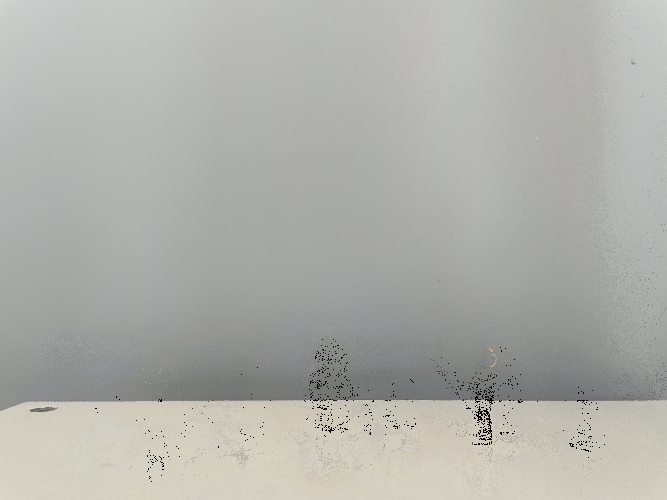

In [19]:
imshow(avg_lego_median)

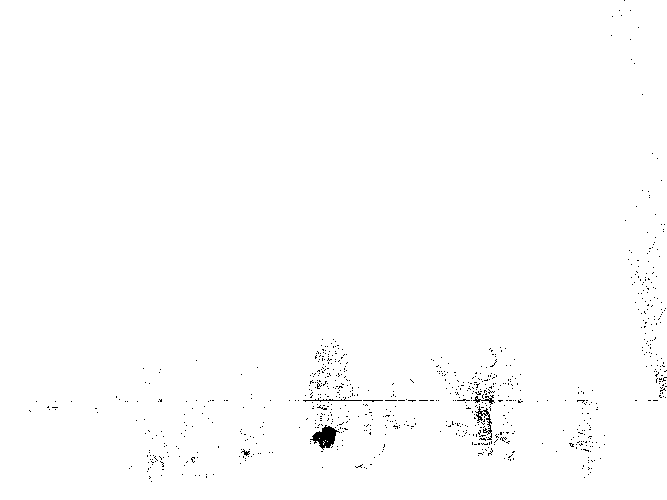

In [21]:
new_lego_noise = get_no_noise_map(np.array([lego_median, avg_lego_median])) * 255
struct = np.ones((1,1), np.uint8)

new_lego_eroded = cv2.dilate(new_lego_noise/255, struct, iterations=3)
new_lego_diff = cv2.erode(new_lego_eroded, struct, iterations=6) * 255

imshow(new_lego_diff)

In [25]:
output = avg_lego_median.copy()
for y in range(500):
    for x in range(667):
        if new_lego_diff[y][x] == 0.0 and (np.all(avg_lego_median[y][x]<65.0) or detect_outlier(avg_lego_median[y][x])):
            row_mean = np.mean(avg_lego_median[y], axis=0)
            column_mean = np.mean(avg_lego_median[:, x, :], axis=0)
            output[y][x] = compute_closest_to_mean(row_mean, column_mean, get_available_pixels(lego, y, x))

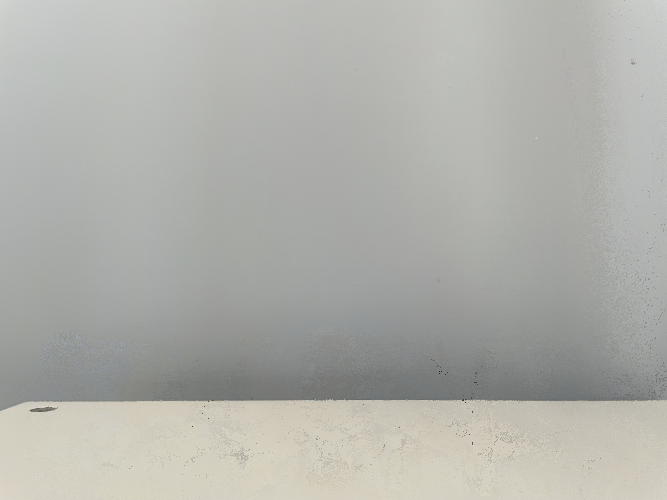

In [26]:
imshow(output)